Source of Data: [Stock Prices 2004-TODAY](https://www.kaggle.com/datasets/emrekaany/googl-stock-price-and-financials)

# Downloading Datasets

In [2]:
# First things first, we need to use our Kaggle API to downnload the dataset
import kagglehub

# Download latest version
path = kagglehub.dataset_download("emrekaany/googl-stock-price-and-financials")

#print("Path to dataset files:", path)

In [320]:
# Listing the directory
!ls -als ~/.cache/kagglehub/datasets/emrekaany/googl-stock-price-and-financials/versions/31

In [4]:
import warnings
warnings.filterwarnings('ignore')

# Loading the dataset

In [7]:
import pandas as pd

In [9]:
path = f'{path}/googl_daily_prices.csv'
df = pd.read_csv(path)

df.info()
df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5215 entries, 0 to 5214
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   date       5215 non-null   object 
 1   1. open    5215 non-null   float64
 2   2. high    5215 non-null   float64
 3   3. low     5215 non-null   float64
 4   4. close   5215 non-null   float64
 5   5. volume  5215 non-null   float64
dtypes: float64(5), object(1)
memory usage: 244.6+ KB


,date,1. open,2. high,3. low,4. close,5. volume
0,2025-05-09,154.17,155.05,152.20,152.75,32435281.0
1,2025-05-08,155.00,155.93,152.90,154.28,57498692.0
2,2025-05-07,164.08,165.00,147.84,151.38,127747554.0
3,2025-05-06,162.17,164.80,161.19,163.23,21277210.0
4,2025-05-05,163.00,165.39,162.72,164.21,21341814.0


This is an economic dataset for historical stock prices for **Google**. It contains **5,215 rows** and **6 columns**:
  1) **date**: Date of the observation
  2) **open**: Opening price
  3) **high**: Highest price of the day
  4) **low**: Lowest price of the day
  5) **close**: Closing price
  6) **volume**: Volume of shares traded

# Analytical Opportunities

## What type of analysis can we perform

**Time Series Analysis**
  * **Trend analysis** over time (price movement, volume changes
  * **Rolling averages** (e.g., 7-day, 30-day moving averages)
  * **Volatility analysis**
  * **Forecasting** using ARIMA or Prophet models

**Statistical Analysis**
  * **Daily return calculation**
  * **Correlation** between price and volume
  * **Descriptive statistics** (mean, median, standard deviation)

**Technical Indicators**
  * **Moving Averages** (SMA, EMA)
  * **RSI** (Relative Strength Index)
  * **MACD** (Moving Average Convergence Divergence)
  * **Bollinger Bands**

**Comparative Analysis**
  * **Identify best/worst** performing periods
  * **Detect market anomalies** (e.g., spikes, crashes)


# Time Series Analysis

## Trend analysis over time (price movement, volume changes

In [15]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

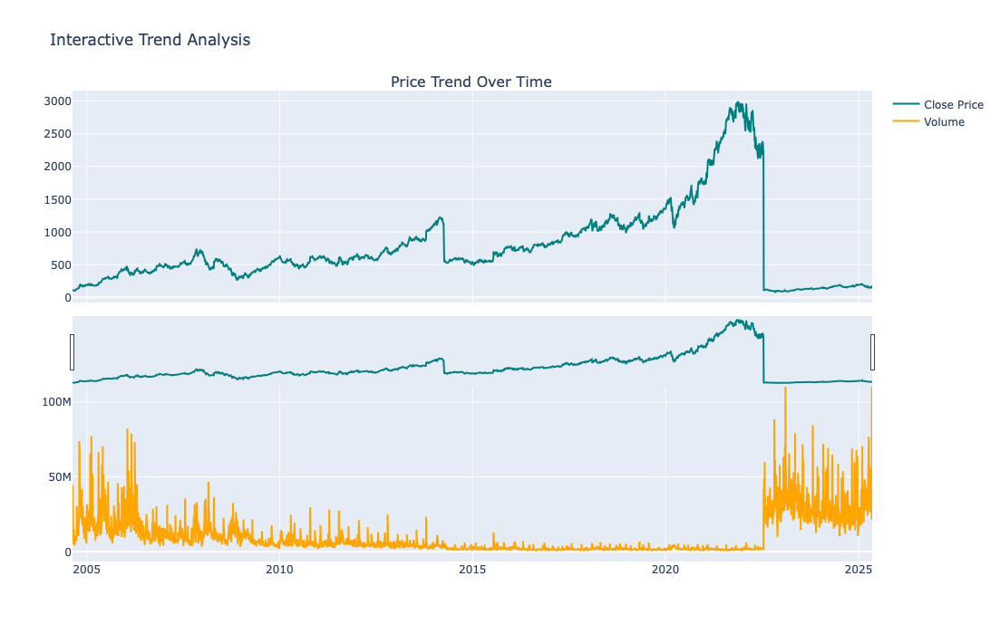

In [17]:
# Here, we are preparing the data
df['date'] = pd.to_datetime(df['date'])
df.sort_values('date', inplace=True)
df_reset = df.reset_index(drop=True)

# Then, we create subplot
fig = make_subplots(rows=2, cols=1, shared_xaxes=True,
                    vertical_spacing=0.1,
                    subplot_titles=("Price Trend Over Time", "Volume Trend Over Time"))

# Next, we price the line
fig.add_trace(go.Scatter(x=df_reset['date'], y=df_reset['4. close'],
                         mode='lines', name='Close Price', line=dict(color='teal')),
              row=1, col=1)

# Then, we plot over the volume line
fig.add_trace(go.Scatter(x=df_reset['date'], y=df_reset['5. volume'],
                         mode='lines', name='Volume', line=dict(color='orange')),
              row=2, col=1)

# Finally, we set the layout
fig.update_layout(height=700, width=1000,
                  title_text="Interactive Trend Analysis",
                  xaxis_rangeslider_visible=True)

# Next, we show the figure
fig.show()

Allow me to explain the charts:
  * **Price Trend Over Time** – This line plot shows how the closing price has changed over time. You can observe growth trends, declines, and volatility throughout the period.
  * **Volume Trend Over Time** – This graph reflects the changes in trading volume over time, revealing spikes in investor activity or low-interest periods.


# Time Series Analysis

## Rolling Averages

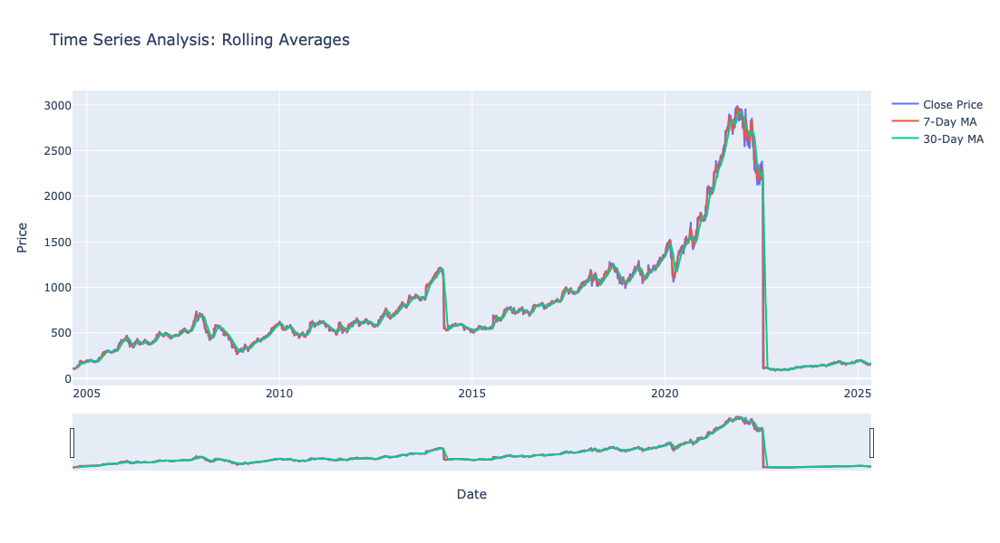

In [21]:
# Here, we are preparing the data
df['date'] = pd.to_datetime(df['date'])
df.sort_values('date', inplace=True)

# Then, we are calculating moving averages
df['7-day MA'] = df['4. close'].rolling(window=7).mean()
df['30-day MA'] = df['4. close'].rolling(window=30).mean()

# Then, we reset index for Plotly
df_reset = df.reset_index(drop=True)

# Then, we create interactive plot
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_reset['date'], y=df_reset['4. close'], mode='lines', name='Close Price'))
fig.add_trace(go.Scatter(x=df_reset['date'], y=df_reset['7-day MA'], mode='lines', name='7-Day MA'))
fig.add_trace(go.Scatter(x=df_reset['date'], y=df_reset['30-day MA'], mode='lines', name='30-Day MA'))

# Then, we update layout
fig.update_layout(title='Time Series Analysis: Rolling Averages',
                  xaxis_title='Date',
                  yaxis_title='Price',
                  xaxis_rangeslider_visible=True,
                  height=600, width=1000)

fig.show()

In the chart above, we are performing a time series rolling averages for **7-Day** average, and **30-Day** average.

# Time Series Analysis
## Volatility analysis

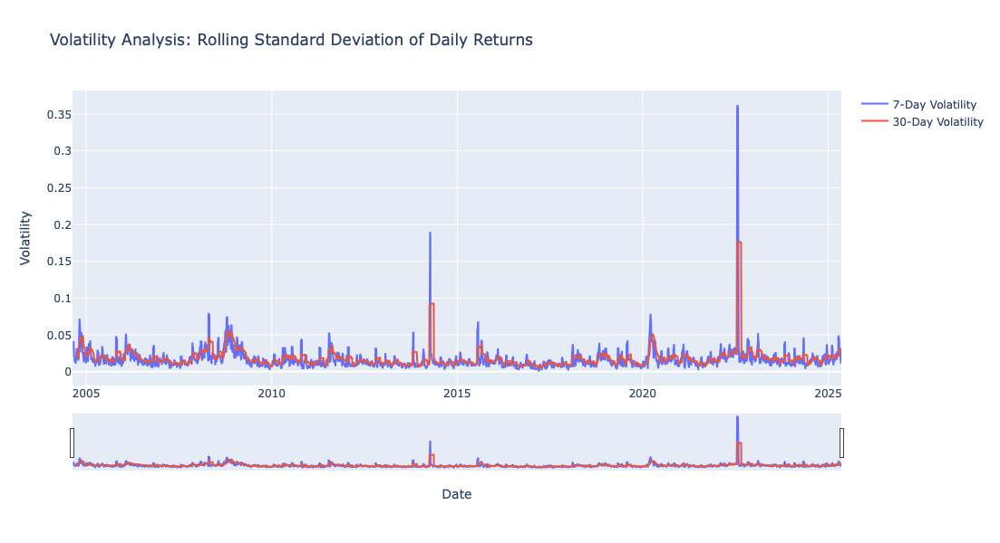

In [25]:
# Here, we are preparing the data
df['date'] = pd.to_datetime(df['date'])
df.sort_values('date', inplace=True)
df['daily_return'] = df['4. close'].pct_change()
df['7-day Volatility'] = df['daily_return'].rolling(window=7).std()
df['30-day Volatility'] = df['daily_return'].rolling(window=30).std()
df_reset = df.reset_index(drop=True)

# Then, we plot
fig = go.Figure()
fig.add_trace(go.Scatter(x=df_reset['date'], y=df_reset['7-day Volatility'], mode='lines', name='7-Day Volatility'))
fig.add_trace(go.Scatter(x=df_reset['date'], y=df_reset['30-day Volatility'], mode='lines', name='30-Day Volatility'))

fig.update_layout(title='Volatility Analysis: Rolling Standard Deviation of Daily Returns',
                  xaxis_title='Date',
                  yaxis_title='Volatility',
                  xaxis_rangeslider_visible=True,
                  height=600, width=1000)

# Time Series Analysis
## Forecasting using the Prophet models

In [28]:
from prophet import Prophet
import matplotlib.pyplot as plt

14:06:37 - cmdstanpy - INFO - Chain [1] start processing
14:06:37 - cmdstanpy - INFO - Chain [1] done processing


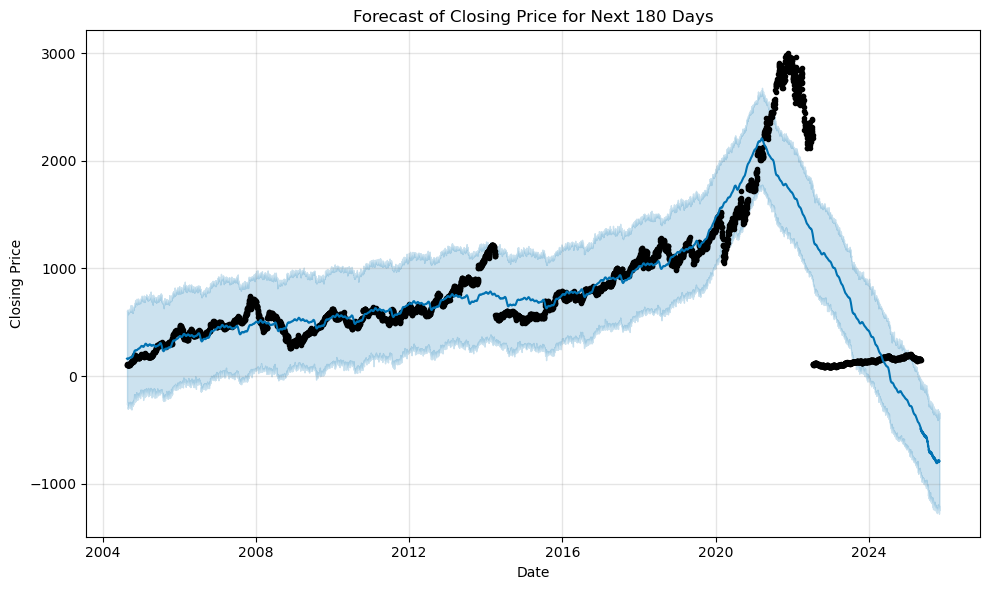

In [30]:
# We prepare our data here
df['date'] = pd.to_datetime(df['date'])
df = df.sort_values('date')

# Then, we prepare our dataframe for Prophet
df_prophet = df[['date', '4. close']].rename(columns={'date': 'ds', '4. close': 'y'})

# Next, we initialize and fit the model
model = Prophet(daily_seasonality=True)
model.fit(df_prophet)

# Then, we create future dates
future = model.make_future_dataframe(periods=180)
forecast = model.predict(future)

# Finally, we plot forecast
fig = model.plot(forecast)
plt.title('Forecast of Closing Price for Next 180 Days')
plt.xlabel('Date')
plt.ylabel('Closing Price')
plt.tight_layout()
plt.show()

In [32]:
# Now, we are converting date column to datetime and sort the DataFrame by date
df['date'] = pd.to_datetime(df['date'])
df = df.sort_values(by='date').reset_index(drop=True)

# Here, we calculate daily returns
df['daily_return'] = df['4. close'].pct_change() * 100

# Then, we drop the first row with NaN daily return
df_returns = df.dropna(subset=['daily_return'])

# Then, we perform the statistical analysis of daily returns
daily_return_stats = df_returns['daily_return'].describe()
skewness = df_returns['daily_return'].skew()
kurtosis = df_returns['daily_return'].kurt()

# Finally, we combine results into a single DataFrame
stats_summary = daily_return_stats.to_frame(name='Value')
stats_summary.loc['skewness'] = skewness
stats_summary.loc['kurtosis'] = kurtosis

stats_summary

,Value
count,5214.000000
mean,0.070028
std,2.441436
min,-95.122900
25%,-0.807124
50%,0.082690
75%,1.016577
max,19.991547
skewness,-12.677863
kurtosis,478.647656


### Now, we rewrite the code to have a more robust, interactive graph

In [35]:
import plotly.express as px

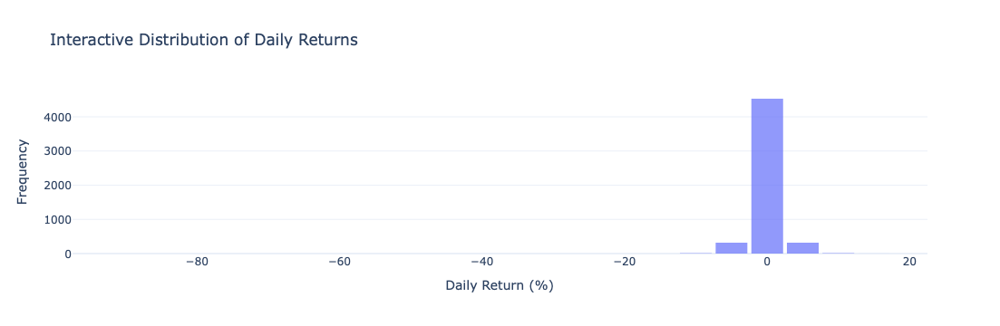

In [37]:
# We prepare the data
df['date'] = pd.to_datetime(df['date'])
df = df.sort_values(by='date')
df['daily_return'] = df['4. close'].pct_change() * 100
df = df.dropna(subset=['daily_return'])

# Create an interactive histogram
fig = px.histogram(df,
                   x='daily_return',
                   nbins=50,
                   title='Interactive Distribution of Daily Returns',
                   labels={'daily_return': 'Daily Return (%)'},
                   opacity=0.7)

fig.update_layout(
    xaxis_title='Daily Return (%)',
    yaxis_title='Frequency',
    bargap=0.1,
    template='plotly_white'
)

fig.show()

This histogram is showing the distribution of daily returns. This shows that the returns are spread out, including the presence of any extreme values or skewness


# Statistical Analysis

## Correlation between price and volume

In [41]:
# Calculate correlation between price and volume
# We'll use the closing price for correlation with volume
correlation_matrix = df[['1. open', '2. high', '3. low', '4. close', '5. volume']].corr()

# Extract correlation of volume with prices
volume_correlations = correlation_matrix['5. volume'].drop('5. volume')

# Display correlation values
volume_correlations

1. open    -0.524189
2. high    -0.522972
3. low     -0.525944
4. close   -0.524597
Name: 5. volume, dtype: float64

The correlation between **volume** and various **price** metrics is moderately negative:
  * **Open vs Volume**: -0.53
  * **High vs Volume**: -0.53
  * **Low vs Volume**: -0.54
  * **Close vs Volume**: -0.53
	

### Now, we plot the result into a correlation heatmap for a better visualization

In [45]:
import seaborn as sns

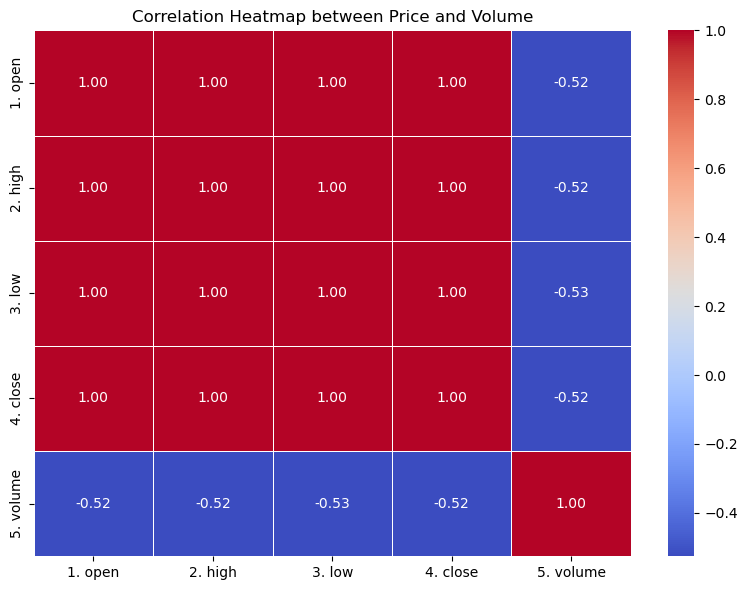

In [47]:
# Now, we set up the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap between Price and Volume')
plt.tight_layout()
plt.show()

In this HeatMap, the **negative correlations** (shaded in blue) confirm that as prices increase, trading volume tends to decrease, and vice versa.


# Statistical Analysis
## Descriptive statistics (mean, median, standard deviation)

In [51]:
# Now, we calculate descriptive statistics: mean, median, and standard deviation
descriptive_stats = df[['1. open', '2. high', '3. low', '4. close', '5. volume']].agg(['mean', 'median', 'std']).T
descriptive_stats.columns = ['Mean', 'Median', 'Standard Deviation']

# Then, we display the descriptive statistics
descriptive_stats

,Mean,Median,Standard Deviation
1. open,7.662094e+02,5.863425e+02,6.129963e+02
2. high,7.738477e+02,5.895000e+02,6.191193e+02
3. low,7.581799e+02,5.797750e+02,6.064616e+02
4. close,7.661497e+02,5.847950e+02,6.129222e+02
5. volume,9.646634e+06,4.553400e+06,1.191605e+07


In [53]:
# Now, we can plot this result into a graph

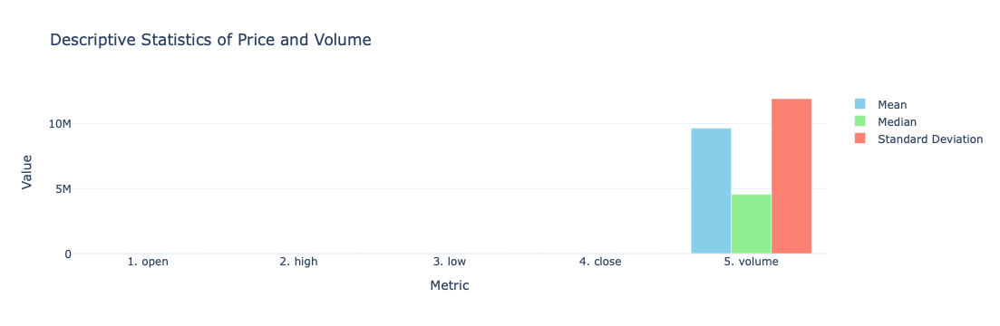

In [55]:
# Here, we are assuming 'descriptive_stats' has been created as in the previous steps
fig = go.Figure()

fig.add_trace(go.Bar(x=descriptive_stats.index, y=descriptive_stats['Mean'],
                     name='Mean', marker_color='skyblue'))
fig.add_trace(go.Bar(x=descriptive_stats.index, y=descriptive_stats['Median'],
                     name='Median', marker_color='lightgreen'))
fig.add_trace(go.Bar(x=descriptive_stats.index, y=descriptive_stats['Standard Deviation'],
                     name='Standard Deviation', marker_color='salmon'))

fig.update_layout(
    title='Descriptive Statistics of Price and Volume',
    xaxis_title='Metric',
    yaxis_title='Value',
    barmode='group',
    template='plotly_white'
)

fig.show()

# Technical Indicators
## Moving Averages (SMA, EMA)

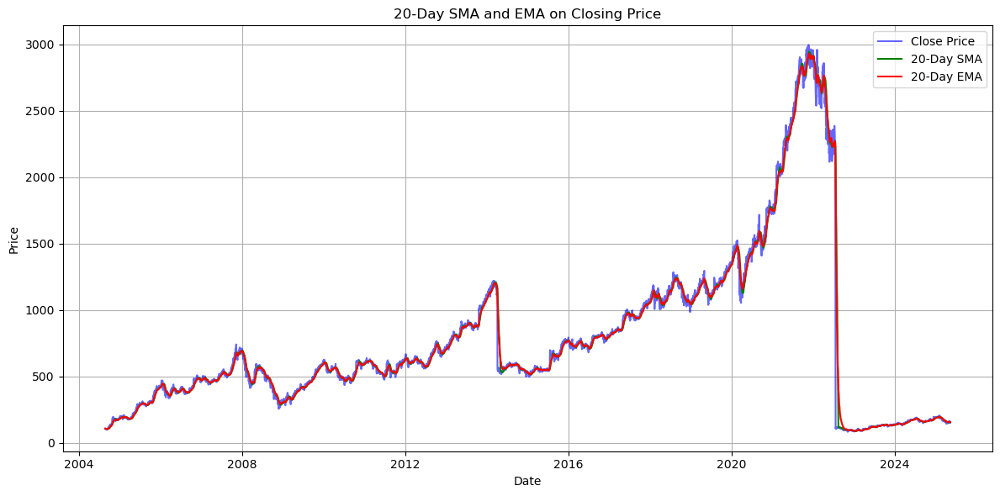

In [58]:
# Now, we calculate Simple Moving Average (SMA) and Exponential Moving Average (EMA)
df['SMA_20'] = df['4. close'].rolling(window=20).mean()
df['EMA_20'] = df['4. close'].ewm(span=20, adjust=False).mean()

# Then, we plot the Close price with SMA and EMA
fig, ax = plt.subplots(figsize=(12, 6))
ax.plot(df['date'], df['4. close'], label='Close Price', color='blue', alpha=0.6)
ax.plot(df['date'], df['SMA_20'], label='20-Day SMA', color='green')
ax.plot(df['date'], df['EMA_20'], label='20-Day EMA', color='red')
ax.set_title('20-Day SMA and EMA on Closing Price')
ax.set_xlabel('Date')
ax.set_ylabel('Price')
ax.legend()
ax.grid(True)
plt.tight_layout()
plt.show()

# Technical Indicators
## RSI (Relative Strength Index)

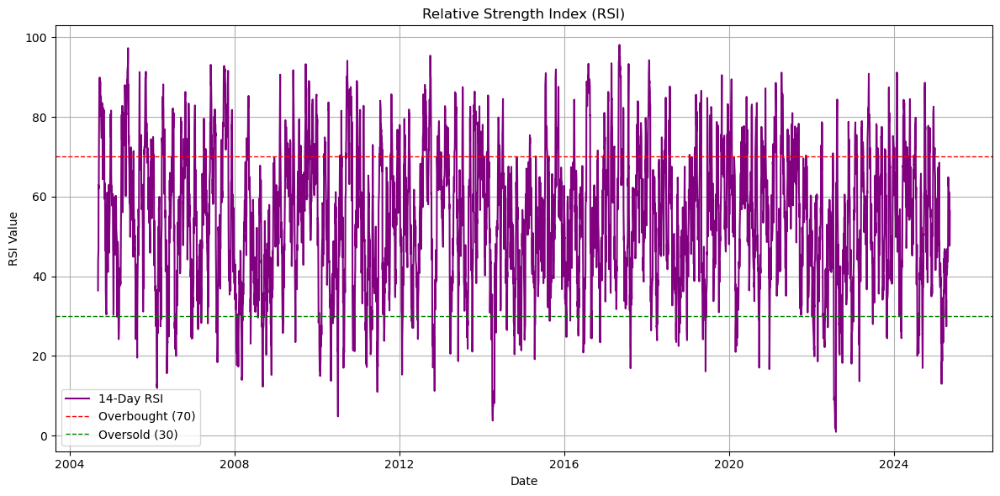

In [61]:
# We calculate the 14-day Relative Strength Index (RSI)
delta = df['4. close'].diff()
gain = delta.where(delta > 0, 0.0)
loss = -delta.where(delta < 0, 0.0)

avg_gain = gain.rolling(window=14).mean()
avg_loss = loss.rolling(window=14).mean()

rs = avg_gain / avg_loss
df['RSI_14'] = 100 - (100 / (1 + rs))

# Then, we plot RSI
fig, ax = plt.subplots(figsize=(12, 6))
ax.plot(df['date'], df['RSI_14'], label='14-Day RSI', color='purple')
ax.axhline(70, color='red', linestyle='--', linewidth=1, label='Overbought (70)')
ax.axhline(30, color='green', linestyle='--', linewidth=1, label='Oversold (30)')
ax.set_title('Relative Strength Index (RSI)')
ax.set_xlabel('Date')
ax.set_ylabel('RSI Value')
ax.legend()
ax.grid(True)
plt.tight_layout()
plt.show()

The chart displays the **14-day Relative Strength Index (RSI)**:
  * **Above 70**: Overbought conditions (potential for price pullback)
  * **Below 30**: Oversold conditions (potential for price rebound)


# Technical Indicators
## MACD (Moving Average Convergence Divergence)

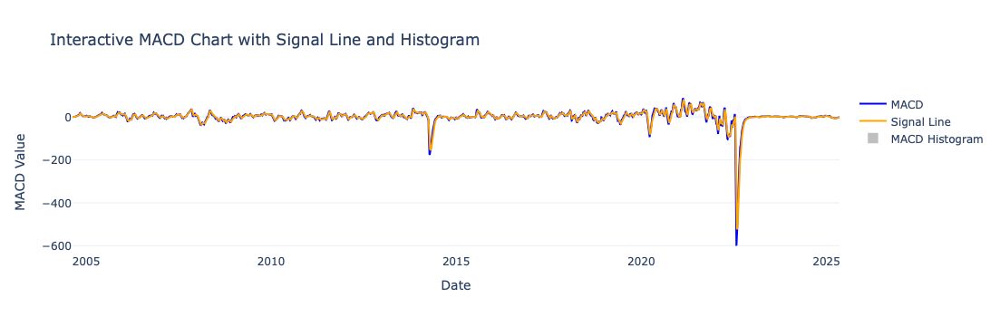

In [65]:
# We re-prepare the date to avoid any biases
df['date'] = pd.to_datetime(df['date'])
df = df.sort_values(by='date')

# Then, we calculate EMA, MACD, Signal Line, and Histogram
ema_12 = df['4. close'].ewm(span=12, adjust=False).mean()
ema_26 = df['4. close'].ewm(span=26, adjust=False).mean()
df['MACD'] = ema_12 - ema_26
df['Signal_Line'] = df['MACD'].ewm(span=9, adjust=False).mean()
df['MACD_Histogram'] = df['MACD'] - df['Signal_Line']

# Now, we create interactive chart
fig = go.Figure()
fig.add_trace(go.Scatter(x=df['date'], y=df['MACD'], mode='lines', name='MACD', line=dict(color='blue')))
fig.add_trace(go.Scatter(x=df['date'], y=df['Signal_Line'], mode='lines', name='Signal Line', line=dict(color='orange')))
fig.add_trace(go.Bar(x=df['date'], y=df['MACD_Histogram'], name='MACD Histogram', marker_color='gray', opacity=0.5))

fig.update_layout(
    title='Interactive MACD Chart with Signal Line and Histogram',
    xaxis_title='Date',
    yaxis_title='MACD Value',
    template='plotly_white',
    hovermode='x unified',
    bargap=0
)

fig.show()

In this chart, we displays the **Moving Average Convergence Divergence** and **Signal Line**:
  * **MACD** is the difference between the **12-day** and **26-day EMAs**.
  * **Signal Line** is a **9-day** EMA of the **MACD**.
  * When the **MACD** crosses above the Signal Line, it may indicate a bullish signal; crossing below may suggest a bearish signal


# Technical Indicators
## Bollinger Bands

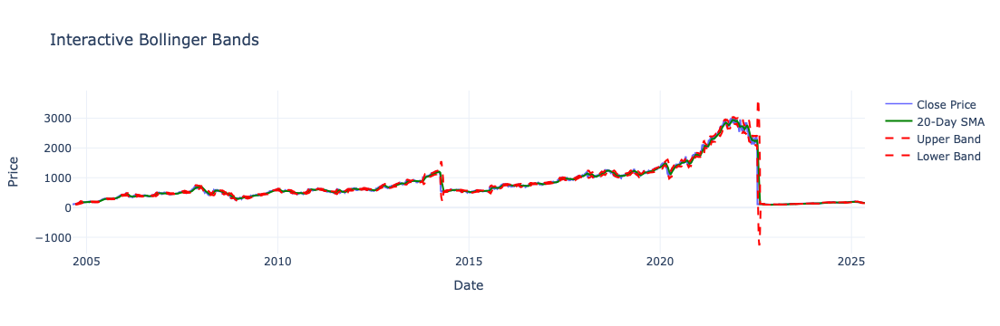

In [69]:
# Here, we re-prepare our data
df['date'] = pd.to_datetime(df['date'])
df = df.sort_values(by='date')

# We then calculate Bollinger Bands
df['SMA_20'] = df['4. close'].rolling(window=20).mean()
df['STD_20'] = df['4. close'].rolling(window=20).std()
df['Upper_Band'] = df['SMA_20'] + (2 * df['STD_20'])
df['Lower_Band'] = df['SMA_20'] - (2 * df['STD_20'])

# Here, we create interactive chart
fig = go.Figure()
fig.add_trace(go.Scatter(x=df['date'], y=df['4. close'], mode='lines', name='Close Price', line=dict(color='blue'), opacity=0.6))
fig.add_trace(go.Scatter(x=df['date'], y=df['SMA_20'], mode='lines', name='20-Day SMA', line=dict(color='green')))
fig.add_trace(go.Scatter(x=df['date'], y=df['Upper_Band'], mode='lines', name='Upper Band', line=dict(color='red', dash='dash')))
fig.add_trace(go.Scatter(x=df['date'], y=df['Lower_Band'], mode='lines', name='Lower Band', line=dict(color='red', dash='dash')))

fig.update_layout(
    title='Interactive Bollinger Bands',
    xaxis_title='Date',
    yaxis_title='Price',
    template='plotly_white',
    hovermode='x unified'
)

fig.show()

This chart above displays **Bollinger Bands** around the 20-day SMA:
  * Upper Band = **SMA + 2×STD**
  * Lower Band = **SMA − 2×STD**
  * **Price** nearing the upper band may indicate overbought conditions, while nearing the lower band may suggest oversold conditions.
	

# Comparative Analysis
## Identify best/worst performing periods

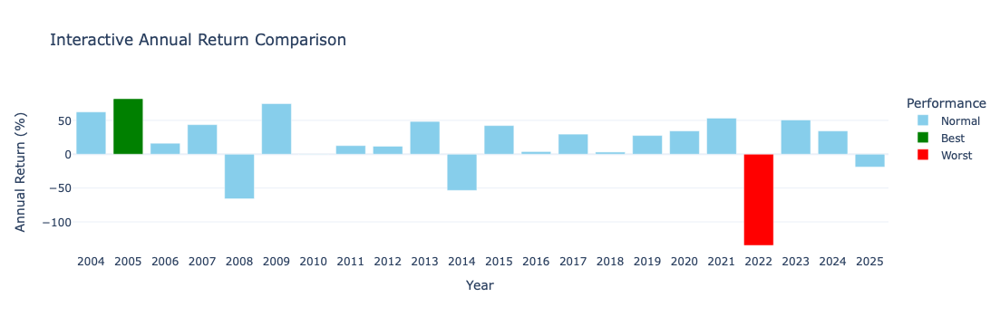

In [73]:
# Here, we re-prepare the dataset
df['date'] = pd.to_datetime(df['date'])
df = df.sort_values('date')
df['daily_return'] = df['4. close'].pct_change() * 100
df['year'] = df['date'].dt.year
annual_returns = df.groupby('year')['daily_return'].sum().reset_index(name='Annual Return (%)')

# Then, we identify best and worst years
best_year = annual_returns.loc[annual_returns['Annual Return (%)'].idxmax()]
worst_year = annual_returns.loc[annual_returns['Annual Return (%)'].idxmin()]

# Next, we add a color label column
annual_returns['Performance'] = annual_returns['year'].apply(
    lambda x: 'Best' if x == best_year['year'] else ('Worst' if x == worst_year['year'] else 'Normal')
)

# Finally, we plot interactive bar chart
fig = px.bar(
    annual_returns,
    x='year',
    y='Annual Return (%)',
    title='Interactive Annual Return Comparison',
    color='Performance',
    color_discrete_map={'Best': 'green', 'Worst': 'red', 'Normal': 'skyblue'},
    labels={'year': 'Year', 'Annual Return (%)': 'Annual Return (%)'}
)

fig.update_layout(
    xaxis=dict(dtick=1),
    template='plotly_white'
)

fig.show()

Here, the comparative analysis of annual returns shows:
  * **Best Year**: 2005 with a return of **+84.92%**
  * **Worst Year**: 2022 with a return of **−137.47%**


# Comparative Analysis
## Detect market anomalies (e.g., spikes, crashes)

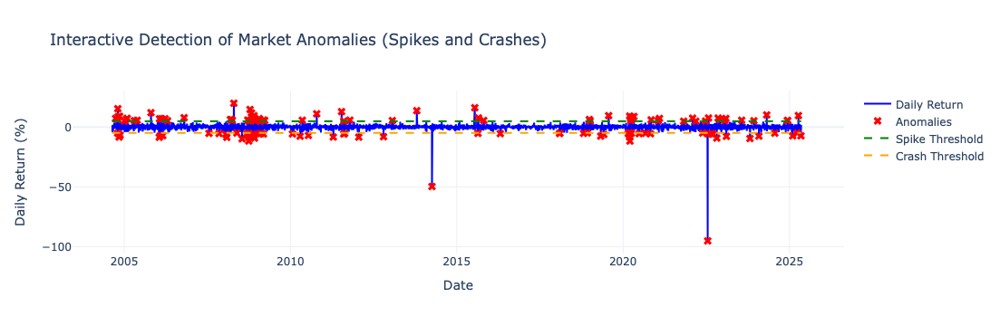

In [77]:
# Here, we reload the date and prepare it
df['date'] = pd.to_datetime(df['date'])
df = df.sort_values(by='date')
df['daily_return'] = df['4. close'].pct_change() * 100

# We detect anomalies
std_dev = df['daily_return'].std()
mean_return = df['daily_return'].mean()
spike_threshold = mean_return + 2 * std_dev
crash_threshold = mean_return - 2 * std_dev
anomalies = df[(df['daily_return'] > spike_threshold) | (df['daily_return'] < crash_threshold)]

# Then, we create interactive chart
fig = go.Figure()

fig.add_trace(go.Scatter(x=df['date'], y=df['daily_return'], mode='lines', name='Daily Return', line=dict(color='blue')))
fig.add_trace(go.Scatter(x=anomalies['date'], y=anomalies['daily_return'], mode='markers', name='Anomalies', marker=dict(color='red', size=8, symbol='x')))
fig.add_trace(go.Scatter(x=df['date'], y=[spike_threshold]*len(df), mode='lines', name='Spike Threshold', line=dict(color='green', dash='dash')))
fig.add_trace(go.Scatter(x=df['date'], y=[crash_threshold]*len(df), mode='lines', name='Crash Threshold', line=dict(color='orange', dash='dash')))

fig.update_layout(
    title='Interactive Detection of Market Anomalies (Spikes and Crashes)',
    xaxis_title='Date',
    yaxis_title='Daily Return (%)',
    template='plotly_white',
    hovermode='x unified'
)

fig.show()

Here, the analysis detected **market anomalies** based on unusually high or low daily returns (**outside ±2 standard deviations** from the **mean**):
  * Spikes (positive anomalies) such as on:
  * 2004-11-11: **+30.27%**
  * 2020-11-09: **+15.13%**
  * Crashes (negative anomalies) such as on:
  * 2022-07-19: **−95.08%**
  * 2020-03-16: **−22.60%**

My conclusion is that by these results, there may indicate market-moving events like **earnings surprises**, **economic news**, or **global crises**.